# Laboratorium 11 - Równania różniczkowe zwyczajne
Jakub Fabia

## Biblioteki

In [1]:
using Plots
using StaticArrays
using DataFrames
using StatsPlots
using Statistics
default(marker = false, legend = :topright)

## Symulacja wahadła magnetycznego - Fraktale

W sprawozdaniu zajmę się numerycznym rozwiązaniem nieliniowego równania różniczkowego drugiego rzędu

$$
\frac{d^2x}{dt^2} + k \frac{dx}{dt} - b(x-x^3)= a \sin{t} 
$$

znanego w literaturze jako równanie Duffinga lub – w kontekście zastosowanym na ćwiczeniach – model wahadła magnetycznego pobudzanego okresowo.

**`duffing!(t, y)`**

Zwraca pochodną stanu `y = SVector(x, v)` w chwili `t`
dla równania   
$$
x'' + k·x' - b(x − x³) = a sin t
$$

In [2]:
function duffing!(t, y::SVector{2,Float64}, a = 0.3, b = 1.0, k = 0.2)
    x, v = y
    dx   = v
    dv   = -k*v + b*(x - x^3) + a*sin(t)
    return SVector(dx, dv)
end

duffing! (generic function with 4 methods)

### Metoda Eulera

**`euler_step(f, t, y, h)`**

Prosty krok Eulera w przód: 
$$ y_{n+1} = y_n + h·f(t_n, y_n) $$

In [3]:
euler_step(f, t, y, h) = y + h * f(t, y)

euler_step (generic function with 1 method)

**`euler_integ(f, y0, tspan, h)`**

Zwraca wektor czasów `ts` i macierz stanów `ys`

In [4]:
function euler_integ(f, y0::SVector, tspan::Tuple, h::Real)
    t0, tstop = tspan
    n = Int(round((tstop - t0)/h))
    ts = collect(t0:h:tstop)
    ys = Vector{SVector{2,Float64}}(undef, n+1)
    ys[1] = y0
    for i in 1:n
        ys[i+1] = euler_step(f, ts[i], ys[i], h)
    end
    return ts, ys
end

euler_integ (generic function with 1 method)

### Metoda Rungego-Kutty 4. rzędu

**`rk4_step(f, t, y, h)`**

Krok RK4:

In [5]:
function rk4_step(f, t, y, h)
    k1 = f(t,         y)
    k2 = f(t + h/2,   y + h/2*k1)
    k3 = f(t + h/2,   y + h/2*k2)
    k4 = f(t + h,     y + h*k3)
    return y + h/6*(k1 + 2k2 + 2k3 + k4)
end

rk4_step (generic function with 1 method)

**`rk4_integ(f, y0, tspan, h)`**

Zwraca `(ts, ys)` analogicznie jak `euler_integ`

In [6]:
function rk4_integ(f, y0::SVector, tspan::Tuple, h::Real)
    t0, tstop = tspan
    n  = Int(round((tstop - t0)/h))
    ts = collect(t0:h:tstop)
    ys = Vector{SVector{2,Float64}}(undef, n+1)
    ys[1] = y0
    for i in 1:n
        ys[i+1] = rk4_step(f, ts[i], ys[i], h)
    end
    return ts, ys
end

rk4_integ (generic function with 1 method)

In [7]:
# Parametry eksperymentu
y0      = @SVector [0.0, 0.0]          # (x₀, v₀)
tspan   = (0.0, 100.0)                 # długość symulacji
steps   = [0.1, 0.05, 0.01, 0.005]     # kroki czasowe

results_long = DataFrame(Method = String[],
                         h      = Float64[],
                         t      = Float64[],
                         x      = Float64[],
                         v      = Float64[])

for h in steps
    ts, ys = euler_integ(duffing!, y0, tspan, h)
    for (t, y) in zip(ts, ys)
        push!(results_long, ("Euler", h, t, y[1], y[2]))
    end

    ts, ys = rk4_integ(duffing!, y0, tspan, h)
    for (t, y) in zip(ts, ys)
        push!(results_long, ("RK4", h, t, y[1], y[2]))
    end
end

println("Zapisano ", size(results_long, 1), " punktów w DataFrame.")

Zapisano 66008 punktów w DataFrame.


In [8]:
display(results_long)

Row,Method,h,t,x,v
,String,Float64,Float64,Float64,Float64
1,Euler,0.1,0.0,0.0,0.0
2,Euler,0.1,0.1,0.0,0.0
3,Euler,0.1,0.2,0.0,0.002995
4,Euler,0.1,0.3,0.0002995,0.00889518
5,Euler,0.1,0.4,0.00118902,0.0176128
6,Euler,0.1,0.5,0.0029503,0.029062
7,Euler,0.1,0.6,0.00585651,0.0431586
8,Euler,0.1,0.7,0.0101724,0.0598203
9,Euler,0.1,0.8,0.0161544,0.0789676


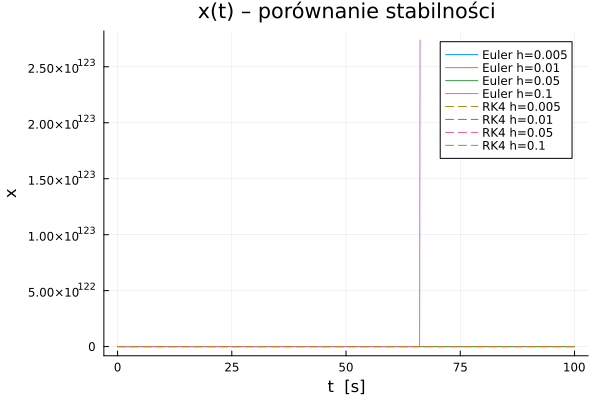

In [9]:
p = plot(title  = "x(t) – porównanie stabilności",
         xlabel = "t  [s]", ylabel = "x")

unique_pairs = unique(results_long[:, [:Method, :h]])
sort!(unique_pairs, [:Method, :h])

for row in eachrow(unique_pairs)
    df = filter(r -> r.Method == row.Method && r.h == row.h, results_long)
    style = row.Method == "RK4" ? :dash : :solid
    plot!(p, df.t, df.x;
          linestyle = style,
          label     = "$(row.Method) h=$(row.h)")
end

display(p)

In [10]:
filter!(row -> !(row.Method == "Euler" && row.h == 0.1 && row.t > 64), results_long)

Row,Method,h,t,x,v
,String,Float64,Float64,Float64,Float64
1,Euler,0.1,0.0,0.0,0.0
2,Euler,0.1,0.1,0.0,0.0
3,Euler,0.1,0.2,0.0,0.002995
4,Euler,0.1,0.3,0.0002995,0.00889518
5,Euler,0.1,0.4,0.00118902,0.0176128
6,Euler,0.1,0.5,0.0029503,0.029062
7,Euler,0.1,0.6,0.00585651,0.0431586
8,Euler,0.1,0.7,0.0101724,0.0598203
9,Euler,0.1,0.8,0.0161544,0.0789676


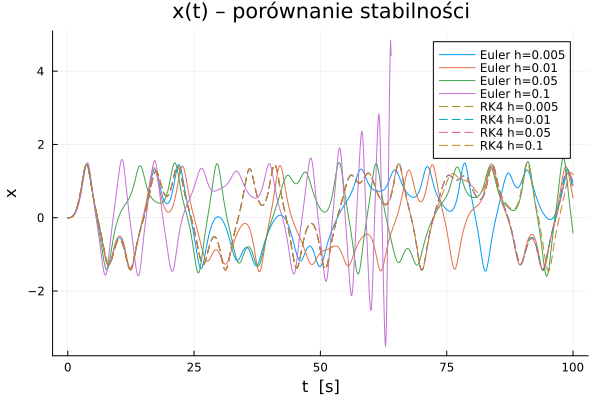

In [11]:
p = plot(title  = "x(t) – porównanie stabilności",
         xlabel = "t  [s]", ylabel = "x")

unique_pairs = unique(results_long[:, [:Method, :h]])
sort!(unique_pairs, [:Method, :h])

for row in eachrow(unique_pairs)
    df = filter(r -> r.Method == row.Method && r.h == row.h, results_long)
    style = row.Method == "RK4" ? :dash : :solid
    plot!(p, df.t, df.x;
          linestyle = style,
          label     = "$(row.Method) h=$(row.h)")
end

display(p)

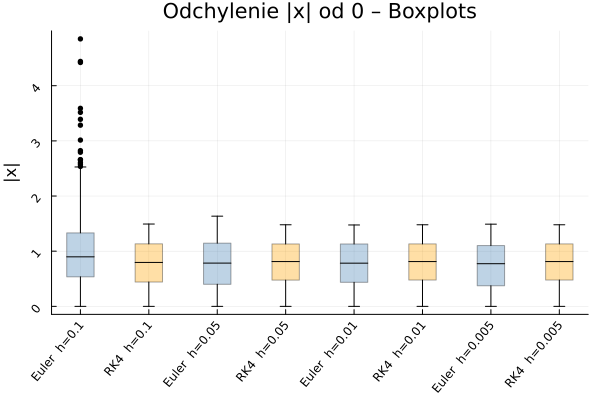

In [12]:
results_long[!, :absx] = abs.(results_long.x);

groups = groupby(results_long, [:Method, :h])

p = plot(title  = "Odchylenie |x| od 0 – Boxplots",
         xlabel = "Metoda i krok h",
         ylabel = "|x|",
         legend = false)

labels = String[]
i = 1

for g in groups
    vals = g.absx
    isempty(vals) && continue

    q1 = quantile(vals, 0.25)
    q2 = quantile(vals, 0.50)
    q3 = quantile(vals, 0.75)
    iqr = q3 - q1
    lower = max(minimum(vals), q1 - 1.5*iqr)
    upper = min(maximum(vals), q3 + 1.5*iqr)

    xrect = [i-0.2, i+0.2, i+0.2, i-0.2]
    yrect = [q1, q1, q3, q3]
    plot!(p, xrect, yrect; seriestype = :shape, opacity = 0.35,
          linecolor = :black, fillcolor = g.Method[1] == "RK4" ? :orange : :steelblue)

    plot!(p, [i-0.2, i+0.2], [q2, q2]; color = :black)

    plot!(p, [i, i], [q3, upper]; color = :black)
    plot!(p, [i, i], [q1, lower]; color = :black)
    plot!(p, [i-0.08, i+0.08], [upper, upper]; color = :black)
    plot!(p, [i-0.08, i+0.08], [lower, lower]; color = :black)

    outliers = filter(v -> v > upper || v < lower, vals)
    if !isempty(outliers)
        scatter!(p, fill(i, length(outliers)), outliers;
                 color = :black, ms = 3, label = "")
    end

    push!(labels, "$(g.Method[1])  h=$(g.h[1])")
    i += 1
end

xticks!(p, 1:length(labels), labels, rotation = 50)

display(p)

**`poincare(f, y0, tspan, h; period=2π, warmup=50.0)`**

Zwraca punkty (x, v) próbkowane co `period`
po `warmup` sekundach rozgrzewki.


In [13]:
function poincare(f, y0, tspan, h; period=2π, warmup=50.0)
    ts, ys = rk4_integ(f, y0, tspan, h)
    pts = SVector{2,Float64}[]
    phase  = 0.0
    for (t, y) in zip(ts, ys)
        if t > warmup && abs(sin((t + phase)/period*π)) < h
            push!(pts, y)
            phase += period
        end
    end
    return pts
end

poincare (generic function with 1 method)

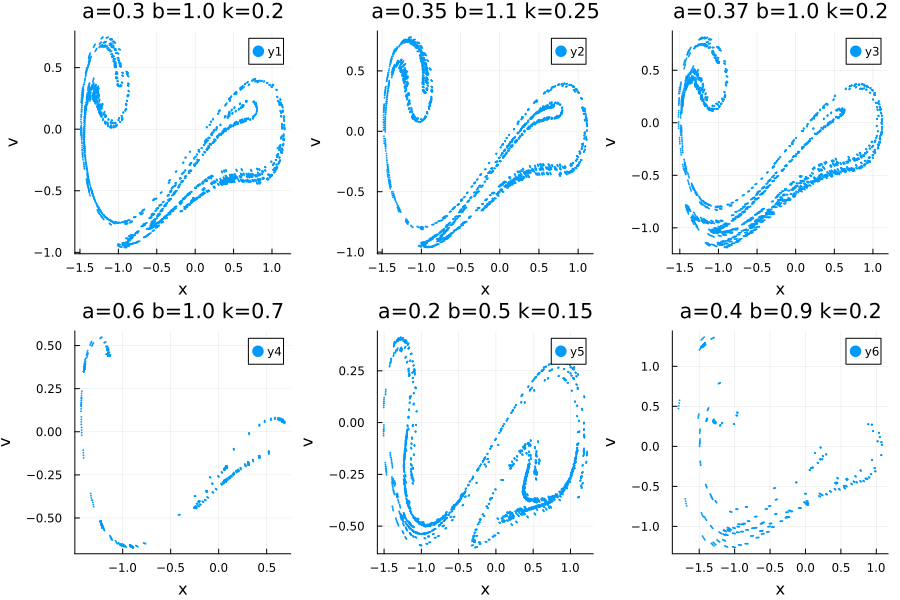

In [14]:
params = [(0.3, 1.0, 0.2), (0.35, 1.1, 0.25), (0.37, 1.00, 0.20), (0.6, 1.0, 0.7), (0.2, 0.5, 0.15), (0.4, 0.90, 0.2)]
p = plot(layout = (2, 3), size=(900,600))

for (idx, (a1, b1, k1)) in enumerate(params)
    f(t,y)  = duffing!(t, y, a1, b1, k1)

    pts = poincare(f, y0, (0.0, 7000.0), 0.01)
    xs  = first.(pts); vs = last.(pts)
    scatter!(p[idx], xs, vs, markerstrokewidth=0,
             title="a=$(a1) b=$(b1) k=$(k1)",
             xlab="x", ylab="v", markersize =1)
end
display(p)


## Rozszerzenie: Atraktor Duffinga

In [15]:
df_anim = filter(row -> row.Method == "RK4" && row.h == 0.01, results_long)

sort!(df_anim, :t)

ts = df_anim.t
xs = df_anim.x
vs = df_anim.v
println("Przygotowano ", length(ts), " klatek animacji.")

Przygotowano 10001 klatek animacji.


[ Info: Saved animation to /home/jovyan/app/Lab11/Assignment/duffing_phase_fast.gif


Plots.AnimatedGif("/home/jovyan/app/Lab11/Assignment/duffing_phase_fast.gif")
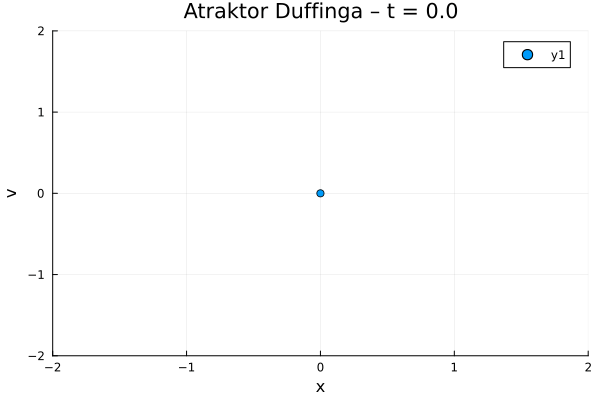

In [16]:
skip = 10
anim = @animate for i in 1:skip:length(ts)
    scatter([xs[i]], [vs[i]];
            xlim = (-2,2), ylim = (-2,2),
            xlabel = "x", ylabel = "v",
            title = "Atraktor Duffinga – t = $(round(ts[i], digits = 1))")
end
gif(anim, "duffing_phase_fast.gif"; fps = 30)